In [ ]:

from matplotlib import pyplot as plt # ploting
from matplotlib import colors # ploting
def imshow(images, titles, nrows = 0, ncols=0, figsize = (15,20)):
    """Plot a multiple images with titles.

    Parameters
    ----------
    images : image list
    titles : title list
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """

    if ncols == 0 and nrows == 0:
      ncols = len(images)
      nrows = 1
    if ncols == 0:
      ncols = len(images) // nrows
    if nrows == 0:
      nrows = len(images) // ncols

    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows, squeeze=False, figsize = figsize)
    for i, image in enumerate(images):
        axeslist.ravel()[i].imshow(image, cmap=plt.gray(), vmin=0, vmax=255)
        axeslist.ravel()[i].set_title(titles[i])
        axeslist.ravel()[i].set_axis_off()
    plt.tight_layout() # optional


In [ ]:
import numpy as np
from pathlib import Path
import cv2
def load_yolo_txt_boxes_xyxy_mixed(label_path, frame_shape, player_class_ids=(3,)):
    """
    Reads a YOLO label txt file that may contain both bbox and segmentation lines.

    - Bbox lines: 5 values  -> class x_c y_c w h   (normalized)
    - Segment lines: >5 vals -> class + polygon coords (we ignore them for players)

    Returns: list of (x1, y1, x2, y2) in pixel coords for selected player classes.
    """
    label_path = Path(label_path)
    if not label_path.exists():
        return []

    if len(frame_shape) == 3:
        H, W, _ = frame_shape
    else:
        H, W = frame_shape

    boxes_xyxy = []

    with label_path.open("r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue

            parts = line.split()
            if len(parts) < 5:
                # malformed or useless
                continue

            cls_id = int(parts[0])

            # We only care about players, and they are bbox-format here
            if cls_id not in player_class_ids:
                continue

            if len(parts) == 5:
                # Standard YOLO bbox: class x_c y_c w h
                x_c_norm = float(parts[1])
                y_c_norm = float(parts[2])
                w_norm   = float(parts[3])
                h_norm   = float(parts[4])

                x_c = x_c_norm * W
                y_c = y_c_norm * H
                w   = w_norm * W
                h   = h_norm * H

                x1 = int(x_c - w / 2)
                y1 = int(y_c - h / 2)
                x2 = int(x_c + w / 2)
                y2 = int(y_c + h / 2)

                boxes_xyxy.append((x1, y1, x2, y2))

    return boxes_xyxy


In [ ]:
def build_player_mask(frame_shape, boxes_xyxy, margin=0):
    """
    frame_shape : (H, W, 3) of the BGR frame, or (H, W)
    boxes_xyxy  : iterable of (x1, y1, x2, y2) in pixel coords (players only)
    margin      : inflate each box by this many pixels on all sides

    returns:
        M_players: mask of shape (H, W), uint8, 0=background, 255=player region
    """
    if len(frame_shape) == 3:
        H, W, _ = frame_shape
    else:
        H, W = frame_shape

    M_players = np.zeros((H, W), dtype=np.uint8)

    for (x1, y1, x2, y2) in boxes_xyxy:
        # Inflate box a bit to be safe
        x1_m = max(int(x1) - margin, 0)
        y1_m = max(int(y1) - margin, 0)
        x2_m = min(int(x2) + margin, W - 1)
        y2_m = min(int(y2) + margin, H - 1)

        M_players[y1_m:y2_m+1, x1_m:x2_m+1] = 255

    return M_players


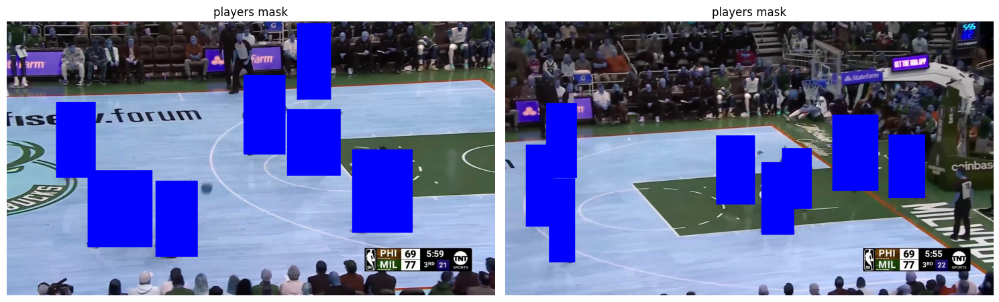

In [ ]:
import cv2
import os
img_path   = "Image/frame_128_jpg.rf.bc29dc6ee2d722a5253e3297c53b95ac.jpg"
label_path = "Image/frame_128_jpg.rf.bc29dc6ee2d722a5253e3297c53b95ac.txt"

def img_path_to_label_path(img_path):
    dir_name, file_name = os.path.split(img_path)   # keep same folder
    base, _ = os.path.splitext(file_name)           # drop .jpg
    return os.path.join(dir_name, base + ".txt")    # same folder, .txt


img_prev_path = "Image/frame_128_jpg.rf.bc29dc6ee2d722a5253e3297c53b95ac.jpg"
img_curr_path = "Image/frame_129_jpg.rf.e1ca73139aed49cebbd887240b464a2c.jpg"


label_prev_path = img_path_to_label_path(img_prev_path)
label_curr_path = img_path_to_label_path(img_curr_path)

img_path = img_curr_path
label_path = label_curr_path

frame = cv2.imread(img_path)


frame1 = cv2.imread(img_prev_path)
frame2 = cv2.imread(img_curr_path)


# Get only player boxes (class 3)
player_boxes = load_yolo_txt_boxes_xyxy_mixed(
    label_path,
    frame.shape,
    player_class_ids=(3,)
)

player_boxes1 = load_yolo_txt_boxes_xyxy_mixed(
    label_prev_path,
    frame1.shape,
    player_class_ids=(3,)
)

player_boxes2 = load_yolo_txt_boxes_xyxy_mixed(
    label_curr_path,
    frame2.shape,
    player_class_ids=(3,)
)

M_players = build_player_mask(frame.shape, player_boxes, margin=0)
M_players1 = build_player_mask(frame1.shape, player_boxes1, margin=0)
M_players2 = build_player_mask(frame2.shape, player_boxes2, margin=0)

M_ignore  = M_players  # currently just ignore players
M_ignore1 = M_players1  # currently just ignore players
M_ignore2 = M_players2  # currently just ignore players

# Visual check
vis = frame.copy()
vis1 = frame1.copy()
vis2 = frame2.copy()

vis[M_players == 255] = (0, 0, 255)
vis1[M_players1 == 255] = (0, 0, 255)
vis2[M_players2 == 255] = (0, 0, 255)

imshow([vis1, vis2], ["players mask","players mask"])



In [ ]:
import cv2
import numpy as np

def compute_lab_chroma_smoothed_gaussian(frame_bgr, ksize=9, sigma=0):
    """
    Convert BGR frame to Lab and smooth chroma channels (a, b) with Gaussian blur.

    Args
    ----
    frame_bgr : np.ndarray (H, W, 3)
        Input BGR image.
    ksize : int
        Gaussian kernel size (must be odd, e.g. 5, 7, 9).
    sigma : float
        Standard deviation for Gaussian. If 0, OpenCV chooses automatically.

    Returns
    -------
    L      : np.ndarray (H, W), uint8
        Lightness channel.
    a_blur : np.ndarray (H, W), float32
        Smoothed a channel.
    b_blur : np.ndarray (H, W), float32
        Smoothed b channel.
    """
    # BGR → Lab
    lab = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2LAB)
    L, a, b = cv2.split(lab)

    # convert to float32 for later math
    a = a.astype(np.float32)
    b = b.astype(np.float32)

    # Gaussian smoothing on chroma channels
    a_blur = cv2.GaussianBlur(a, (ksize, ksize), sigma)
    b_blur = cv2.GaussianBlur(b, (ksize, ksize), sigma)

    return L, a_blur, b_blur


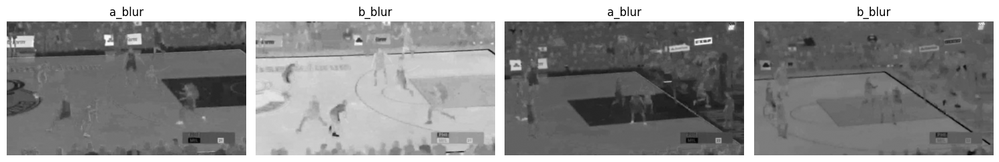

In [ ]:
# --- Color & smoothing step ---
L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(
    frame,
    ksize=7,   # you can try 7 or 11 too
    sigma=0    # let OpenCV choose based on ksize
)
L1, a_blur1, b_blur1 = compute_lab_chroma_smoothed_gaussian(
    frame1,
    ksize=7,
    sigma=0
)

L2, a_blur2, b_blur2 = compute_lab_chroma_smoothed_gaussian(
    frame2,
    ksize=7,
    sigma=0
)

# Example: visualize a_blur or b_blur (scaled to 0-255 just to see them)
a_vis = cv2.normalize(a_blur, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
b_vis = cv2.normalize(b_blur, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

a_vis1 = cv2.normalize(a_blur1, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
b_vis1 = cv2.normalize(b_blur1, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

a_vis2 = cv2.normalize(a_blur2, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
b_vis2 = cv2.normalize(b_blur2, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

imshow([a_vis1, b_vis1, a_vis2, b_vis2], ["a_blur", "b_blur","a_blur", "b_blur"])


In [ ]:
import numpy as np

def select_court_seeds_bottom_center(
    a_blur,
    b_blur,
    M_ignore,
    x_min_frac=0.25,
    x_max_frac=0.75,
    y_min_frac=0.5,
    y_max_frac=0.95,
    num_seeds=3
):
    """
    Select seed pixels for court region-growing using a bottom-central ROI.

    Args
    ----
    a_blur, b_blur : np.ndarray (H, W), float32
        Smoothed Lab chroma channels.
    M_ignore       : np.ndarray (H, W), uint8
        255 where players (or other stuff) should be ignored, 0 elsewhere.
    x_min_frac, x_max_frac, y_min_frac, y_max_frac : float
        Fractions of width/height defining the ROI.
    num_seeds      : int
        Number of seed pixels to return.

    Returns
    -------
    seeds : list of (x, y) tuples (ints)
        Pixel coordinates of selected seeds in image space.
    a_med, b_med : float
        Median chroma values in the ROI (over valid pixels).
        Useful as initial court color estimate.
    """
    H, W = a_blur.shape

    # Define ROI bounds in pixel coordinates
    x_min = int(x_min_frac * W)
    x_max = int(x_max_frac * W)
    y_min = int(y_min_frac * H)
    y_max = int(y_max_frac * H)

    # Clamp to valid range
    x_min = max(0, min(x_min, W - 1))
    x_max = max(0, min(x_max, W))
    y_min = max(0, min(y_min, H - 1))
    y_max = max(0, min(y_max, H))

    # Build a ROI mask: True inside bottom-central ROI
    roi_mask = np.zeros_like(M_ignore, dtype=bool)
    roi_mask[y_min:y_max, x_min:x_max] = True

    # Valid pixels: inside ROI and not ignored (no players)
    valid_mask = (M_ignore == 0) & roi_mask

    ys, xs = np.where(valid_mask)
    if len(xs) == 0:
        # Fallback: if ROI is completely occluded, use whole image except ignore
        valid_mask = (M_ignore == 0)
        ys, xs = np.where(valid_mask)
        if len(xs) == 0:
            # No valid pixels at all -> return empty seeds
            return [], None, None

    # Extract chroma values for valid pixels
    a_vals = a_blur[ys, xs]
    b_vals = b_blur[ys, xs]

    # Median chroma in ROI (approx court color)
    a_med = np.median(a_vals)
    b_med = np.median(b_vals)

    # Distance of each candidate pixel to median chroma
    da = a_vals - a_med
    db = b_vals - b_med
    dist2 = da * da + db * db  # squared distance

    # Indices of the closest pixels to the median
    order = np.argsort(dist2)
    num_seeds = min(num_seeds, len(order))

    seeds = []
    for idx in order[:num_seeds]:
        y = int(ys[idx])
        x = int(xs[idx])
        seeds.append((x, y))

    return seeds, float(a_med), float(b_med)


In [ ]:
# 1) Load frame & build ignore mask from YOLO labels
frame = cv2.imread(img_path)

player_boxes = load_yolo_txt_boxes_xyxy_mixed(
    label_path,
    frame.shape,
    player_class_ids=(3,)
)
M_players = build_player_mask(frame.shape, player_boxes, margin=15)
M_ignore  = M_players

# 2) Lab + Gaussian smoothing
L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(frame, ksize=9, sigma=0)

# 3) Seed selection in bottom-central ROI
seeds, a_med, b_med = select_court_seeds_bottom_center(a_blur, b_blur, M_ignore)

print("Selected seeds:", seeds)
print("Median chroma (a_med, b_med):", a_med, b_med)


Selected seeds: [(598, 620), (581, 620), (579, 620)]
Median chroma (a_med, b_med): 137.98587036132812 143.8675537109375


In [ ]:
# Compute gradient magnitude on L (or grayscale)
gray = L  # L from Lab is fine
gx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
gy = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)
grad_mag = cv2.magnitude(gx, gy)

# Normalize to [0,255] for easier thresholding / debug
grad_norm = cv2.normalize(grad_mag, None, 0, 255, cv2.NORM_MINMAX)
grad_norm = grad_norm.astype(np.uint8)


In [ ]:
import numpy as np
from collections import deque

def grow_court_region_chroma(
    a_blur,
    b_blur,
    M_ignore,
    seeds,
    T_color=10.0,
    update_mean=True,
    connectivity=4,
    max_pixels=None,
    grad_norm=None,
    T_grad=40
):
    """
    Region-growing in Lab chroma space starting from seed pixels.

    Args
    ----
    a_blur, b_blur : np.ndarray (H, W), float32
        Smoothed Lab chroma channels.
    M_ignore       : np.ndarray (H, W), uint8
        0 = valid, 255 = ignored (players, etc.).
    seeds          : list of (x, y) tuples
        Seed pixel coordinates in image space.
    T_color        : float
        Threshold on chroma distance to region mean (in (a,b) space).
        Typical range ~ 8-15 for Lab; you can tune.
    update_mean    : bool
        If True, update region mean (a_mean, b_mean) as the region grows.
    connectivity   : int
        4 or 8. 4-connected (up/down/left/right) is more conservative.
    max_pixels     : int or None
        Optional cap on region size. If not None, stop once this many pixels
        are included.

    Returns
    -------
    mask_region : np.ndarray (H, W), uint8
        255 where pixel is in the grown region, 0 elsewhere.
    """
    H, W = a_blur.shape

    # Output mask and visited map
    mask_region = np.zeros((H, W), dtype=np.uint8)
    visited = np.zeros((H, W), dtype=bool)

    # Neighbor offsets
    if connectivity == 8:
        neighbors = [(-1, -1), (0, -1), (1, -1),
                     (-1,  0),          (1,  0),
                     (-1,  1), (0,  1), (1,  1)]
    else:  # 4-connected
        neighbors = [(0, -1), (-1, 0), (1, 0), (0, 1)]

    # Initialize region statistics from seed pixels
    seed_pixels = []
    for (x, y) in seeds:
        if 0 <= x < W and 0 <= y < H:
            if M_ignore[y, x] == 0:  # not ignored
                seed_pixels.append((x, y))

    if not seed_pixels:
        return mask_region  # empty

    # Initial mean chroma over seeds
    a_vals = [a_blur[y, x] for (x, y) in seed_pixels]
    b_vals = [b_blur[y, x] for (x, y) in seed_pixels]
    a_mean = float(np.mean(a_vals))
    b_mean = float(np.mean(b_vals))

    # For running mean
    sum_a = a_mean * len(seed_pixels)
    sum_b = b_mean * len(seed_pixels)
    count = len(seed_pixels)

    # BFS queue
    q = deque()
    for (x, y) in seed_pixels:
        visited[y, x] = True
        mask_region[y, x] = 255
        q.append((x, y))

    # Optional cap
    if max_pixels is None:
        max_pixels = H * W  # effectively no cap

    # BFS region growing
    while q and count < max_pixels:
        x, y = q.popleft()

        for dx, dy in neighbors:
            nx = x + dx
            ny = y + dy

            # Bounds check
            if not (0 <= nx < W and 0 <= ny < H):
                continue

            # Already visited?
            if visited[ny, nx]:
                continue

            visited[ny, nx] = True

            # Ignore players etc.
            if M_ignore[ny, nx] != 0:
                continue
            if grad_norm is not None and grad_norm[ny, nx] > T_grad:
                continue
            # Chroma distance to current region mean
            a_val = a_blur[ny, nx]
            b_val = b_blur[ny, nx]
            da = a_val - a_mean
            db = b_val - b_mean
            dist = np.sqrt(da * da + db * db)

            if dist <= T_color:
                mask_region[ny, nx] = 255
                q.append((nx, ny))

                # Update running mean if enabled
                if update_mean:
                    sum_a += a_val
                    sum_b += b_val
                    count += 1
                    a_mean = sum_a / count
                    b_mean = sum_b / count

    return mask_region


Seeds: [(598, 620), (581, 620), (579, 620)]  median: 137.98587036132812 143.8675537109375


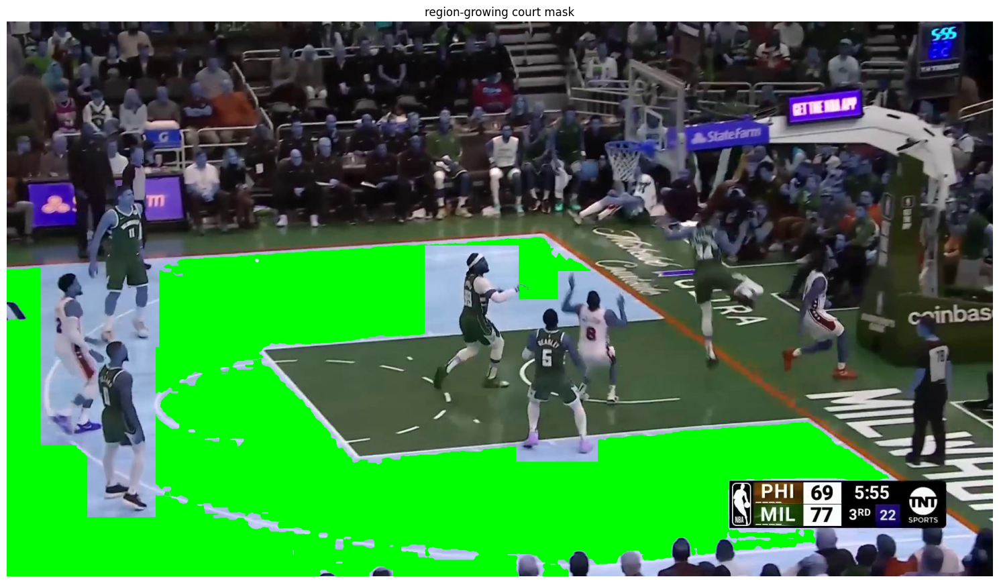

In [ ]:
# 1) Load frame and mask players
frame = cv2.imread(img_path)

player_boxes = load_yolo_txt_boxes_xyxy_mixed(
    label_path,
    frame.shape,
    player_class_ids=(3,)
)
M_players = build_player_mask(frame.shape, player_boxes, margin=15)
M_ignore  = M_players

# 2) Lab + Gaussian smoothing
L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(frame, ksize=9, sigma=0)

# 3) Seed selection (bottom-center)
seeds, a_med, b_med = select_court_seeds_bottom_center(a_blur, b_blur, M_ignore)
print("Seeds:", seeds, " median:", a_med, b_med)

# 4) Region growing in chroma space
mask_court_rg = grow_court_region_chroma(
    a_blur,
    b_blur,
    M_ignore,
    seeds,
    T_color=5.0,
    update_mean=True,
    connectivity=4,
    max_pixels=None,
    grad_norm=grad_norm,
    T_grad=40  # tune this
)


# 5) Visual check
vis_court = frame.copy()
vis_court[mask_court_rg == 255] = (0, 255, 0)  # color grown region green
imshow([vis_court], ["region-growing court mask"])


In [ ]:
import numpy as np

def segment_court_by_chroma_scanlines(
    a_blur,
    b_blur,
    M_ignore,
    T_cont=6.0,
    min_segment_len=40,
    max_avg_delta=3.0,
    y_min_frac=0.3,
    y_max_frac=0.98
):
    """
    Segment 'smooth' regions by scanning rows and grouping pixels with small
    chroma changes (a,b). Players (M_ignore) act as barriers.

    Args
    ----
    a_blur, b_blur : (H, W) float32
        Smoothed Lab chroma channels.
    M_ignore       : (H, W) uint8
        255 where pixels should be ignored (players, etc.), 0 elsewhere.
    T_cont         : float
        Maximum chroma difference between consecutive pixels to stay in same segment.
    min_segment_len : int
        Minimum length (in pixels) of a segment to be kept.
    max_avg_delta  : float
        Maximum average Δc inside the segment (to ensure smoothness).
    y_min_frac, y_max_frac : float
        Only process rows between [y_min_frac * H, y_max_frac * H].

    Returns
    -------
    mask_smooth : (H, W) uint8
        255 for pixels belonging to 'smooth' segments, 0 otherwise.
    """
    H, W = a_blur.shape
    mask_smooth = np.zeros((H, W), dtype=np.uint8)

    y_min = int(y_min_frac * H)
    y_max = int(y_max_frac * H)
    y_min = max(0, min(y_min, H-1))
    y_max = max(0, min(y_max, H))

    for y in range(y_min, y_max):
        x = 0
        while x < W:
            # skip ignored pixels
            while x < W and M_ignore[y, x] != 0:
                x += 1
            if x >= W:
                break

            # start of a new segment
            seg_start = x
            prev_a = a_blur[y, x]
            prev_b = b_blur[y, x]
            sum_delta = 0.0
            steps = 0

            x += 1
            while x < W:
                if M_ignore[y, x] != 0:
                    # hit player / ignored → end segment
                    break

                a_val = a_blur[y, x]
                b_val = b_blur[y, x]
                da = a_val - prev_a
                db = b_val - prev_b
                delta = np.sqrt(da*da + db*db)

                if delta > T_cont:
                    # too big color jump → new segment
                    break

                sum_delta += delta
                steps += 1
                prev_a, prev_b = a_val, b_val
                x += 1

            seg_end = x  # exclusive

            seg_len = seg_end - seg_start
            if seg_len >= min_segment_len and steps > 0:
                avg_delta = sum_delta / steps
                if avg_delta <= max_avg_delta:
                    # mark segment as smooth
                    mask_smooth[y, seg_start:seg_end] = 255

            # next segment starts at current x (already advanced)
    return mask_smooth


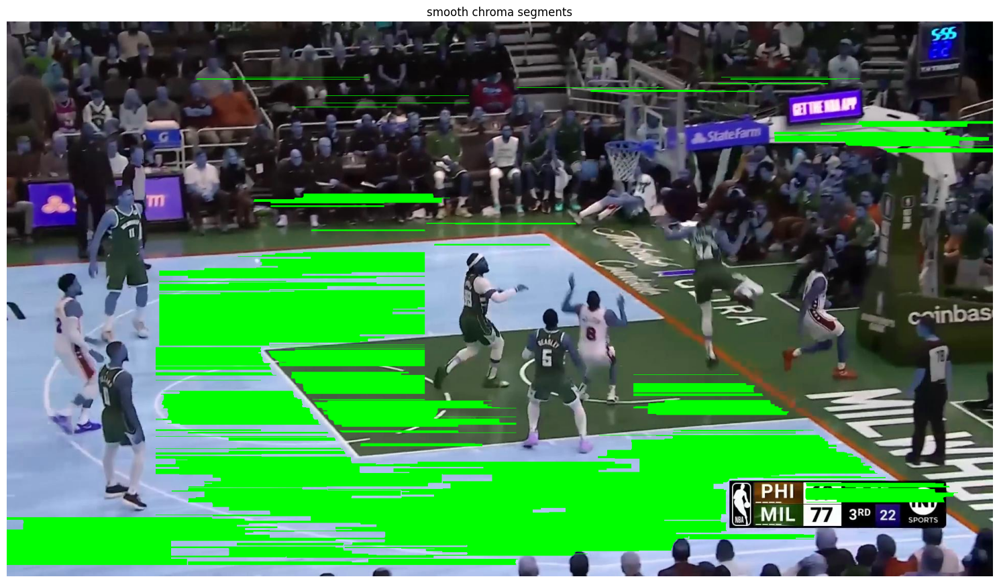

In [ ]:
# 1) Load frame & ignore mask as you already do
frame = cv2.imread(img_path)

player_boxes = load_yolo_txt_boxes_xyxy_mixed(
    label_path,
    frame.shape,
    player_class_ids=(3,)
)
M_players = build_player_mask(frame.shape, player_boxes, margin=15)
M_ignore  = M_players

# 2) Lab + Gaussian smoothing (we already have this)
L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(frame, ksize=9, sigma=0)

# 3) Scanline chroma segmentation
mask_smooth = segment_court_by_chroma_scanlines(
    a_blur,
    b_blur,
    M_ignore,
    T_cont=0.5,        # tune: try 4–8
    min_segment_len=200, # tune depending on resolution
    max_avg_delta=3.0, # tune: smaller = smoother segments only
    y_min_frac=0.1,    # ignore top stands a bit
    y_max_frac=0.98
)

# 4) Visualize
vis = frame.copy()
vis[mask_smooth == 255] = (0, 255, 0)
imshow([vis], ["smooth chroma segments"])


In [ ]:
import numpy as np

def compute_dominant_court_bin_lab(
    a_blur,
    b_blur,
    court_mask,
    num_bins=16
):
    """
    Build a 2D histogram over (a,b) chroma for pixels where court_mask != 0,
    find the dominant bin, and return pixel locations belonging to it.

    Args
    ----
    a_blur, b_blur : (H, W) float32
        Lab chroma channels (blurred).
    court_mask     : (H, W) uint8
        0 = ignore, nonzero = candidate court pixels.
    num_bins       : int
        Number of bins per dimension (num_bins x num_bins histogram).

    Returns
    -------
    hist        : (num_bins, num_bins) int32
        2D histogram of counts.
    a_bin_idx   : int
        Index of dominant bin along 'a' axis (0..num_bins-1).
    b_bin_idx   : int
        Index of dominant bin along 'b' axis (0..num_bins-1).
    ys, xs      : 1D arrays
        Pixel coordinates (row, col) of pixels in the dominant bin.
    """
    H, W = a_blur.shape

    # 1) Select only pixels where court_mask != 0
    ys_all, xs_all = np.where(court_mask != 0)
    if len(ys_all) == 0:
        # No pixels => return empty
        hist = np.zeros((num_bins, num_bins), dtype=np.int32)
        return hist, None, None, np.array([], dtype=int), np.array([], dtype=int)

    a_vals = a_blur[ys_all, xs_all]
    b_vals = b_blur[ys_all, xs_all]

    # 2) Map [0, 255] -> bin indices [0, num_bins-1]
    bin_size = 256.0 / num_bins

    a_bins = np.clip((a_vals / bin_size).astype(int), 0, num_bins - 1)
    b_bins = np.clip((b_vals / bin_size).astype(int), 0, num_bins - 1)

    # 3) Build 2D histogram
    hist = np.zeros((num_bins, num_bins), dtype=np.int32)
    np.add.at(hist, (a_bins, b_bins), 1)

    # 4) Find dominant bin (highest count)
    flat_idx = np.argmax(hist)
    a_bin_idx = flat_idx // num_bins
    b_bin_idx = flat_idx % num_bins

    # 5) Find all pixels that fall into that bin
    in_dom_bin = (a_bins == a_bin_idx) & (b_bins == b_bin_idx)

    ys = ys_all[in_dom_bin]
    xs = xs_all[in_dom_bin]

    return hist, a_bin_idx, b_bin_idx, ys, xs


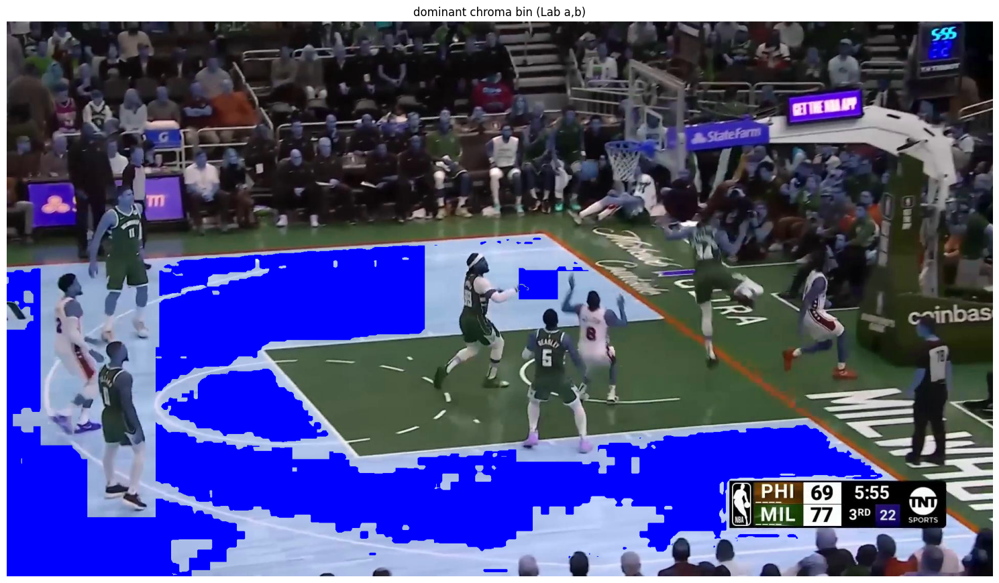

In [ ]:
frame = cv2.imread(img_path)

# players → ignore
player_boxes = load_yolo_txt_boxes_xyxy_mixed(
    label_path,
    frame.shape,
    player_class_ids=(3,)
)
M_players = build_player_mask(frame.shape, player_boxes, margin=15)
M_ignore  = M_players

# Lab + blur
L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(frame, ksize=9, sigma=0)

# Scanline segmentation
mask_smooth = segment_court_by_chroma_scanlines(
    a_blur,
    b_blur,
    M_ignore,
    T_cont=0.5,
    min_segment_len=100,
    max_avg_delta=3.0,
    y_min_frac=0.1,
    y_max_frac=0.98
)
court_mask = mask_court_rg   # or output of grow_court_region_chroma

hist, a_bin_idx, b_bin_idx, ys_dom, xs_dom = compute_dominant_court_bin_lab(
    a_blur,
    b_blur,
    court_mask,
    num_bins=16
)
mask_dom = np.zeros_like(court_mask, dtype=np.uint8)
mask_dom[ys_dom, xs_dom] = 255

vis = frame.copy()
vis[mask_dom == 255] = (0, 0, 255)  # show dominant bin pixels in red, for example

imshow([vis], ["dominant chroma bin (Lab a,b)"])


In [ ]:
def get_global_mask_for_bin_lab(a_blur, b_blur, a_bin_idx, b_bin_idx, num_bins=16):
    """
    Return a mask (H,W) = 255 where the pixel's (a,b) falls into the given bin.
    """
    H, W = a_blur.shape
    bin_size = 256.0 / num_bins

    # Compute bin indices for ALL pixels (2D, same shape as image)
    a_bins = np.clip((a_blur / bin_size).astype(int), 0, num_bins - 1)
    b_bins = np.clip((b_blur / bin_size).astype(int), 0, num_bins - 1)

    # Select pixels whose (a_bin, b_bin) matches
    mask = np.zeros((H, W), dtype=np.uint8)
    sel = (a_bins == a_bin_idx) & (b_bins == b_bin_idx)
    mask[sel] = 255
    return mask


In [ ]:
hist, a_bin_idx, b_bin_idx, ys_dom, xs_dom = compute_dominant_court_bin_lab(
    a_blur,
    b_blur,
    court_mask,
    num_bins=16
)

if a_bin_idx is not None:
    mask_court_global = get_global_mask_for_bin_lab(
        a_blur, b_blur, a_bin_idx, b_bin_idx, num_bins=16
    )
else:
    mask_court_global = np.zeros_like(court_mask, dtype=np.uint8)


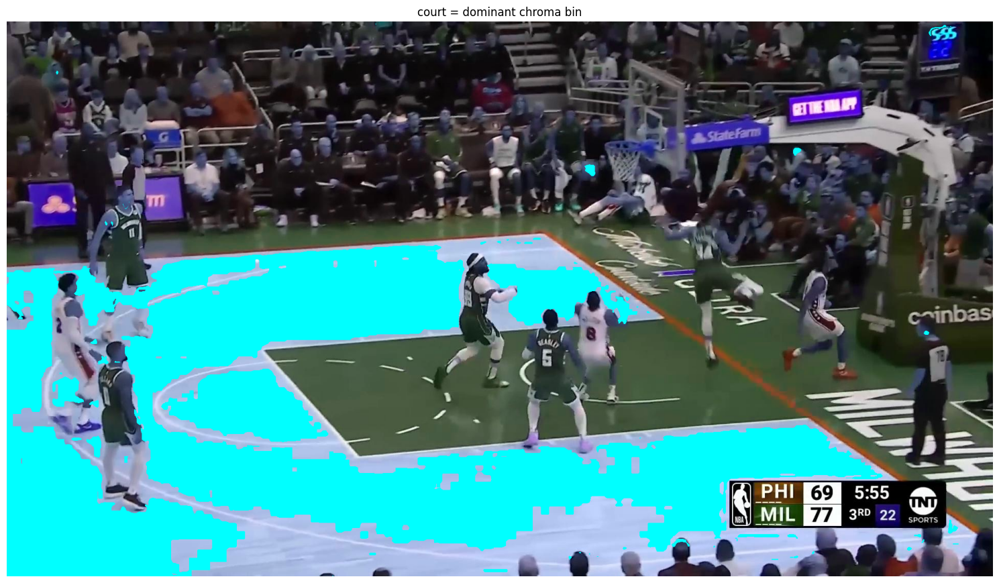

In [ ]:
vis = frame.copy()
vis[mask_court_global == 255] = (0, 255, 255)  # cyan for global court bin
imshow([vis], ["court = dominant chroma bin"])


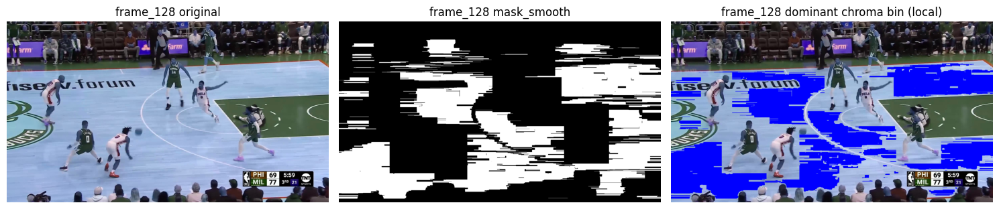

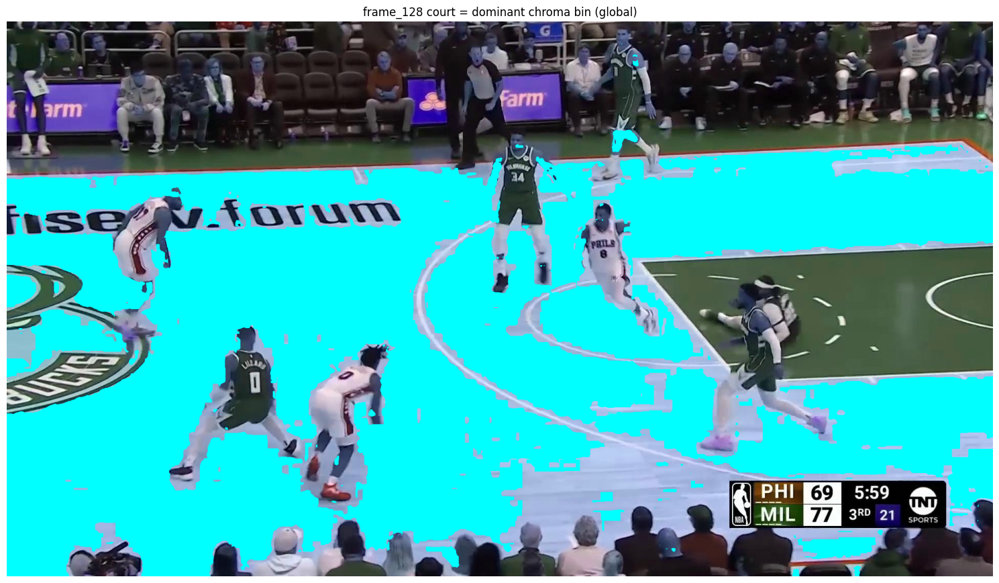

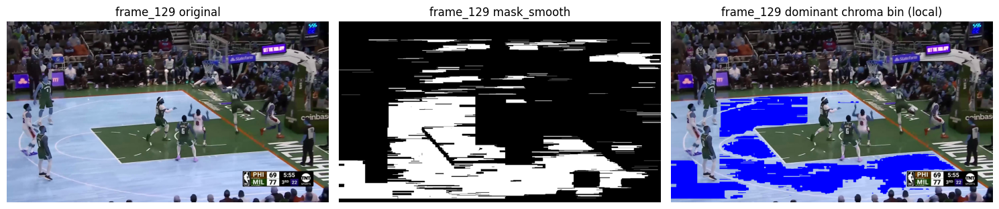

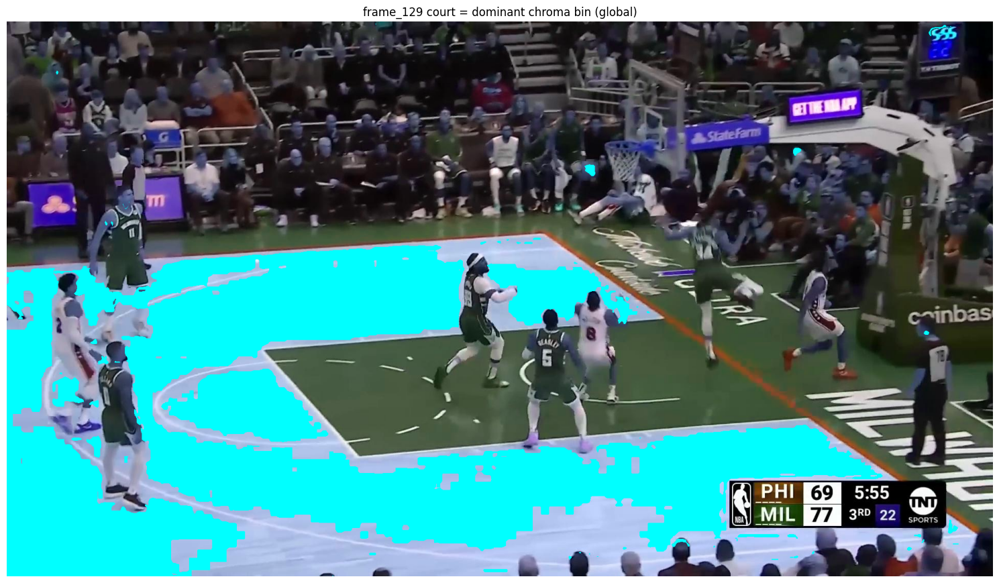

In [ ]:
import cv2
import numpy as np

img_prev_path = "Image/frame_128_jpg.rf.bc29dc6ee2d722a5253e3297c53b95ac.jpg"
img_curr_path = "Image/frame_129_jpg.rf.e1ca73139aed49cebbd887240b464a2c.jpg"

def run_pipeline_and_visualize(img_path, title_prefix=""):
    label_path = img_path_to_label_path(img_path)

    # 1) Read frame
    frame = cv2.imread(img_path)

    # 2) players → ignore
    player_boxes = load_yolo_txt_boxes_xyxy_mixed(
        label_path,
        frame.shape,
        player_class_ids=(3,)   # adjust if needed
    )
    M_players = build_player_mask(frame.shape, player_boxes, margin=15)
    M_ignore  = M_players

    # 3) Lab + blur
    L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(frame, ksize=9, sigma=0)

    # 4) Scanline segmentation (initial court mask)
    mask_smooth = segment_court_by_chroma_scanlines(
        a_blur,
        b_blur,
        M_ignore,
        T_cont=0.5,
        min_segment_len=100,
        max_avg_delta=3.0,
        y_min_frac=0.1,
        y_max_frac=0.98
    )
    court_mask = mask_smooth   # or output of grow_court_region_chroma

    # 5) Dominant bin from court_mask
    hist, a_bin_idx, b_bin_idx, ys_dom, xs_dom = compute_dominant_court_bin_lab(
        a_blur,
        b_blur,
        court_mask,
        num_bins=16
    )

    # --- Visualization 1: only pixels in dominant bin inside court_mask ---

    mask_dom = np.zeros_like(court_mask, dtype=np.uint8)
    mask_dom[ys_dom, xs_dom] = 255

    vis_dom = frame.copy()
    vis_dom[mask_dom == 255] = (0, 0, 255)  # red for dominant bin (inside court mask)

    imshow(
        [frame, mask_smooth, vis_dom],
        [
            f"{title_prefix} original",
            f"{title_prefix} mask_smooth",
            f"{title_prefix} dominant chroma bin (local)"
        ]
    )

    # --- Visualization 2: global court mask = all pixels in that bin everywhere ---

    if a_bin_idx is not None:
        mask_court_global = get_global_mask_for_bin_lab(
            a_blur, b_blur, a_bin_idx, b_bin_idx, num_bins=16
        )
    else:
        mask_court_global = np.zeros_like(court_mask, dtype=np.uint8)

    vis_global = frame.copy()
    vis_global[mask_court_global == 255] = (0, 255, 255)  # cyan for global court bin

    imshow(
        [vis_global],
        [f"{title_prefix} court = dominant chroma bin (global)"]
    )

    return {
        "hist": hist,
        "a_bin_idx": a_bin_idx,
        "b_bin_idx": b_bin_idx,
        "mask_smooth": mask_smooth,
        "mask_dom": mask_dom,
        "mask_court_global": mask_court_global,
    }

# Run on your two frames
out_prev = run_pipeline_and_visualize(img_prev_path, title_prefix="frame_128")
out_curr = run_pipeline_and_visualize(img_curr_path, title_prefix="frame_129")


In [ ]:
import numpy as np
import cv2

def refine_court_mask_with_hull_bottom(mask_binary, min_bottom_frac=0.6):
    """
    Refine a binary court mask by:
      1) keeping only the largest connected component that reaches
         the lower part of the image
      2) computing its convex hull

    Args
    ----
    mask_binary : (H, W) uint8
        0 background, nonzero = candidate court pixels.
    min_bottom_frac : float
        Component must extend at least this far down (fraction of H)
        to be considered (e.g. 0.6 => bottom 40% of image).

    Returns
    -------
    mask_largest_cc : (H, W) uint8
        Mask of the chosen connected component (0/255).
    mask_hull       : (H, W) uint8
        Mask of the convex hull of that component (0/255).
    hull_points     : (N, 1, 2) int32 or None
        Convex hull polygon in (x, y). None if nothing valid.
    """
    H, W = mask_binary.shape

    # Ensure binary 0/255
    mask_bin = (mask_binary > 0).astype(np.uint8) * 255

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        mask_bin, connectivity=8
    )

    if num_labels <= 1:
        return np.zeros_like(mask_bin), np.zeros_like(mask_bin), None

    # stats[i] = [x, y, w, h, area] ; i=0 is background
    tops    = stats[1:, cv2.CC_STAT_TOP]
    heights = stats[1:, cv2.CC_STAT_HEIGHT]
    areas   = stats[1:, cv2.CC_STAT_AREA]

    bottoms = tops + heights        # y-coordinate of bottom of each CC
    bottom_thresh = int(min_bottom_frac * H)

    # Keep components that reach low enough in the image
    valid_idx = np.where(bottoms >= bottom_thresh)[0]  # indices for labels 1..num_labels-1

    if len(valid_idx) == 0:
        # Fallback: just take the largest area overall (old behavior)
        largest_label = 1 + np.argmax(areas)
    else:
        # Among valid ones, pick largest area
        best_idx = valid_idx[np.argmax(areas[valid_idx])]
        largest_label = 1 + best_idx  # +1 because stats/areas start from label 1

    # Build mask for that component
    mask_largest_cc = np.zeros_like(mask_bin)
    mask_largest_cc[labels == largest_label] = 255

    # Convex hull of that component
    contours, _ = cv2.findContours(
        mask_largest_cc, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    if len(contours) == 0:
        return mask_largest_cc, np.zeros_like(mask_bin), None

    all_points = np.vstack(contours)
    hull = cv2.convexHull(all_points)

    mask_hull = np.zeros_like(mask_bin)
    cv2.fillConvexPoly(mask_hull, hull, 255)

    return mask_largest_cc, mask_hull, hull


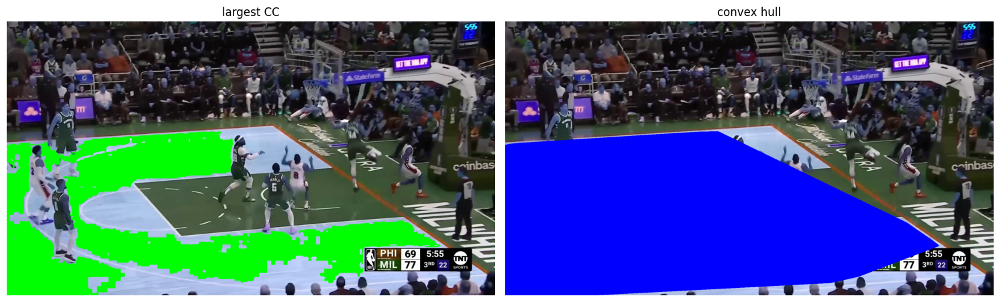

In [ ]:
# after dominant bin step
mask_court_global, ys_dom, xs_dom = get_pixels_in_bin_lab(
    a_blur,
    b_blur,
    a_bin_idx,
    b_bin_idx,
    num_bins=16
)
mask_largest_cc, mask_court_hull, hull_pts = refine_court_mask_with_hull_bottom(mask_court_global)
vis_cc = frame.copy()
vis_cc[mask_largest_cc == 255] = (0, 255, 0)   # largest CC in green

vis_hull = frame.copy()
vis_hull[mask_court_hull == 255] = (0, 0, 255) # convex hull in red

imshow([vis_cc, vis_hull], ["largest CC", "convex hull"])


In [ ]:
import numpy as np
import cv2

def detect_vertical_hull_edges(
    hull,
    image_shape,
    min_rel_length=0.25,
    max_vertical_tan=0.2,
    side_margin_frac=0.25
):
    """
    Detect long, almost-vertical edges of the convex hull,
    and decide if they are on the LEFT or RIGHT side of the image.

    Args
    ----
    hull : (N, 1, 2) or (N, 2)
        Convex hull points from cv2.convexHull (x, y).
    image_shape : tuple
        Shape of the image (H, W, ...) or (H, W).
    min_rel_length : float
        Minimum length of edge as a fraction of image height (e.g. 0.25 => 25% of H).
    max_vertical_tan : float
        How vertical an edge must be: abs(dx) <= max_vertical_tan * abs(dy).
    side_margin_frac : float
        Fraction of image width used to define "left side" and "right side".
        Example: 0.25 => left = x < 0.25*W, right = x > 0.75*W.

    Returns
    -------
    has_left_vertical_edge : bool
        True if at least one long vertical hull edge is on the LEFT side.
    has_right_vertical_edge : bool
        True if at least one long vertical hull edge is on the RIGHT side.
    left_edges  : list of ((x1, y1), (x2, y2))
    right_edges : list of ((x1, y1), (x2, y2))
        Edges that matched the criteria for each side (useful for debugging).
    """
    if hull is None or len(hull) < 2:
        return False, False, [], []

    # Normalize hull shape to (N, 2)
    pts = hull.reshape(-1, 2)
    H, W = image_shape[:2]

    length_thresh = min_rel_length * H
    has_left = False
    has_right = False
    left_edges = []
    right_edges = []

    N = len(pts)
    for i in range(N):
        x1, y1 = pts[i]
        x2, y2 = pts[(i + 1) % N]  # wrap around

        dx = float(x2 - x1)
        dy = float(y2 - y1)
        length = np.hypot(dx, dy)

        # 1) Long enough
        if length < length_thresh:
            continue

        # 2) Almost vertical: |dx| << |dy|
        if abs(dy) < 1e-6:  # avoid div by zero
            continue
        if abs(dx) > max_vertical_tan * abs(dy):
            continue

        # 3) Position: left or right side
        x_avg = 0.5 * (x1 + x2)

        if x_avg < side_margin_frac * W:
            has_left = True
            left_edges.append(((int(x1), int(y1)), (int(x2), int(y2))))
        elif x_avg > (1.0 - side_margin_frac) * W:
            has_right = True
            right_edges.append(((int(x1), int(y1)), (int(x2), int(y2))))

    return has_left, has_right, left_edges, right_edges


In [ ]:
def detect_court_corners_from_hull(hull, image_shape):
    """
    Decide if the frame likely contains the left and/or right lower court corners,
    based on long vertical hull edges.

    Returns
    -------
    contains_left_corner  : bool
    contains_right_corner : bool
    info : dict
        Extra debug info (edges etc.).
    """
    has_left_edge, has_right_edge, left_edges, right_edges = detect_vertical_hull_edges(
        hull,
        image_shape,
        min_rel_length=0.25,   # you can tune this
        max_vertical_tan=0.2,  # smaller => stricter "vertical"
        side_margin_frac=0.25  # 25% left/right bands
    )

    # Paper rule:
    #   right vertical edge  -> frame contains LEFT corner
    #   left vertical edge   -> frame contains RIGHT corner
    contains_left_corner = has_right_edge
    contains_right_corner = has_left_edge

    info = {
        "has_left_vertical_edge": has_left_edge,
        "has_right_vertical_edge": has_right_edge,
        "left_edges": left_edges,
        "right_edges": right_edges,
    }

    return contains_left_corner, contains_right_corner, info


In [ ]:
mask_largest_cc, mask_court_hull, hull_pts = refine_court_mask_with_hull_bottom(mask_court_global)
contains_left_corner, contains_right_corner, debug_info = \
    detect_court_corners_from_hull(hull_pts, frame.shape)
print("left corner visible? ", contains_left_corner)
print("right corner visible?", contains_right_corner)


left corner visible?  False
right corner visible? True


In [ ]:
"""!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="wX5s7jy2hRtVPT9m03GW")
project = rf.workspace("roboflow-universe-projects").project("basketball-players-fy4c2")
version = project.version(25)
dataset = version.download("yolov8")
                """

'!pip install roboflow\n\nfrom roboflow import Roboflow\nrf = Roboflow(api_key="wX5s7jy2hRtVPT9m03GW")\nproject = rf.workspace("roboflow-universe-projects").project("basketball-players-fy4c2")\nversion = project.version(25)\ndataset = version.download("yolov8")\n                '

A
A
A
A
A
AA
A
A
A
A
A
A
A



L


In [ ]:
import numpy as np

def get_all_court_pixels(mask_court_hull):
    """
    Return an array of (x, y) coordinates for all pixels inside the court hull.
    mask_court_hull: (H, W), 0/1 or 0/255.
    """
    # if mask is 0/255, make it 0/1
    mask_bool = mask_court_hull > 0

    ys, xs = np.where(mask_bool)  # row = y, col = x
    pts = np.stack([xs, ys], axis=1).astype(np.float32)  # shape (N, 2), each = [x, y]

    return pts

# usage
court_pixels = get_all_court_pixels(mask_court_hull)
print(court_pixels.shape)  # (N, 2)


(826321, 2)


In [ ]:
import cv2
import numpy as np

def compute_court_homography_from_klt(
    prev_bgr,
    curr_bgr,
    player_boxes_prev=None,
    player_boxes_curr=None,
    max_corners=500,
    quality_level=0.01,
    min_distance=7,
    block_size=7
):
    """
    Estimate homography between prev_bgr (frame f-1) and curr_bgr (frame f)
    using KLT features, after rejecting features lying on players.

    Parameters
    ----------
    prev_bgr : np.ndarray
        Previous frame (f-1) in BGR format.
    curr_bgr : np.ndarray
        Current frame (f) in BGR format.
    player_boxes_prev : list of (x1, y1, x2, y2), optional
        Player bounding boxes in prev frame (f-1).
    player_boxes_curr : list of (x1, y1, x2, y2), optional
        Player bounding boxes in current frame (f).
    max_corners, quality_level, min_distance, block_size :
        Parameters for cv2.goodFeaturesToTrack.

    Returns
    -------
    H : np.ndarray or None
        3x3 homography matrix mapping points in curr_bgr -> prev_bgr.
        (So you can warp curr into prev's coordinate system.)
        Returns None if not enough good inliers.
    pts_prev_inliers : np.ndarray
        Inlier points in prev frame (Nx2) used for H.
    pts_curr_inliers : np.ndarray
        Inlier points in curr frame (Nx2) used for H.
    """

    # Convert to grayscale
    prev_gray = cv2.cvtColor(prev_bgr, cv2.COLOR_BGR2GRAY)
    curr_gray = cv2.cvtColor(curr_bgr, cv2.COLOR_BGR2GRAY)

    H_img, W_img = prev_gray.shape

    # ----- 1) Create feature detection mask for prev frame (ignore players) -----
    # Start with full 255 (allowed), then put 0 inside player boxes
    mask_prev = np.full_like(prev_gray, 255, dtype=np.uint8)

    if player_boxes_prev is not None:
        for (x1, y1, x2, y2) in player_boxes_prev:
            x1 = max(0, int(x1))
            y1 = max(0, int(y1))
            x2 = min(W_img - 1, int(x2))
            y2 = min(H_img - 1, int(y2))
            mask_prev[y1:y2+1, x1:x2+1] = 0

    # ----- 2) Detect good features to track in prev frame (on court only) -----
    pts_prev = cv2.goodFeaturesToTrack(
        prev_gray,
        maxCorners=max_corners,
        qualityLevel=quality_level,
        minDistance=min_distance,
        blockSize=block_size,
        mask=mask_prev
    )

    if pts_prev is None or len(pts_prev) < 4:
        # Not enough points to estimate homography
        return None, None, None

    # ----- 3) Track features with KLT (LK optical flow) -----
    pts_curr, status, err = cv2.calcOpticalFlowPyrLK(
        prev_gray,
        curr_gray,
        pts_prev,
        None,
        winSize=(21, 21),
        maxLevel=3,
        criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01)
    )

    # Keep only successfully tracked points
    status = status.reshape(-1)
    pts_prev = pts_prev.reshape(-1, 2)[status == 1]
    pts_curr = pts_curr.reshape(-1, 2)[status == 1]

    if len(pts_prev) < 4:
        return None, None, None

    # ----- 4) Reject points falling inside player boxes in EITHER frame -----
    def in_any_box(pt, boxes):
        if boxes is None:
            return False
        x, y = pt
        for (bx1, by1, bx2, by2) in boxes:
            if (bx1 <= x <= bx2) and (by1 <= y <= by2):
                return True
        return False

    pts_prev_filtered = []
    pts_curr_filtered = []

    for p_prev, p_curr in zip(pts_prev, pts_curr):
        if in_any_box(p_prev, player_boxes_prev):
            continue
        if in_any_box(p_curr, player_boxes_curr):
            continue
        pts_prev_filtered.append(p_prev)
        pts_curr_filtered.append(p_curr)

    pts_prev_filtered = np.array(pts_prev_filtered, dtype=np.float32)
    pts_curr_filtered = np.array(pts_curr_filtered, dtype=np.float32)

    if len(pts_prev_filtered) < 4:
        # Not enough points for homography
        return None, None, None

    # ----- 5) Estimate homography with RANSAC -----
    H, inliers = cv2.findHomography(
        pts_curr_filtered,  # source (frame f)
        pts_prev_filtered,  # destination (frame f-1)
        method=cv2.RANSAC,
        ransacReprojThreshold=3.0,
        maxIters=2000,
        confidence=0.995
    )

    if H is None:
        return None, None, None

    inliers = inliers.ravel().astype(bool)
    pts_prev_inliers = pts_prev_filtered[inliers]
    pts_curr_inliers = pts_curr_filtered[inliers]

    if len(pts_prev_inliers) < 4:
        return None, None, None

    return H, pts_prev_inliers, pts_curr_inliers


In [ ]:
import numpy as np

def load_player_boxes_from_yolo(label_path, img_w, img_h, player_class_id=3):
    """
    Read YOLO label file and return list of (x1, y1, x2, y2) for 'Player' class.
    Coordinates are in pixel units.
    """
    boxes = []
    if not os.path.exists(label_path):
        return boxes  # no labels

    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls_id = int(parts[0])
            if cls_id != player_class_id:
                continue

            cx, cy, w, h = map(float, parts[1:])
            # convert from normalized to pixel coordinates
            cx *= img_w
            cy *= img_h
            w  *= img_w
            h  *= img_h

            x1 = cx - w / 2
            y1 = cy - h / 2
            x2 = cx + w / 2
            y2 = cy + h / 2

            boxes.append((x1, y1, x2, y2))

    return boxes


In [ ]:


import cv2

img_prev_path = "Image/frame_140_jpg.rf.27a72e37ccccf0f3413f77c68a9ec091.jpg"
img_curr_path = "Image/frame_141_jpg.rf.15a8a5916cd2379e99088b8e2d91922f.jpg"

# 1) Read images
prev_bgr = cv2.imread(img_prev_path)
curr_bgr = cv2.imread(img_curr_path)

if prev_bgr is None or curr_bgr is None:
    raise RuntimeError("Error reading one of the images")

H_img, W_img = prev_bgr.shape[:2]

# 2) Get corresponding label paths
label_prev_path = img_path_to_label_path(img_prev_path)
label_curr_path = img_path_to_label_path(img_curr_path)

# 3) Load player boxes from YOLO labels
PLAYER_CLASS_ID = 3  # change if needed
boxes_prev = load_player_boxes_from_yolo(label_prev_path, W_img, H_img, player_class_id=PLAYER_CLASS_ID)
boxes_curr = load_player_boxes_from_yolo(label_curr_path, W_img, H_img, player_class_id=PLAYER_CLASS_ID)

# 4) Call the homography function we wrote before
H, pts_prev_inliers, pts_curr_inliers = compute_court_homography_from_klt(
    prev_bgr,
    curr_bgr,
    player_boxes_prev=boxes_prev,
    player_boxes_curr=boxes_curr
)

print("Homography:\n", H)
print("Num inlier matches:", 0 if H is None else len(pts_prev_inliers))

# 5) Example: warp curr into prev coordinates if H is valid
if H is not None:
    warped_curr = cv2.warpPerspective(curr_bgr, H, (W_img, H_img))
    # you can now display prev_bgr and warped_curr, or blend them


Homography:
 [[ 1.00353552e+00  2.33367318e-02 -2.20275679e+01]
 [-1.00550274e-03  1.00476540e+00  1.23185925e+00]
 [-1.14203192e-06  6.11339209e-06  1.00000000e+00]]
Num inlier matches: 124


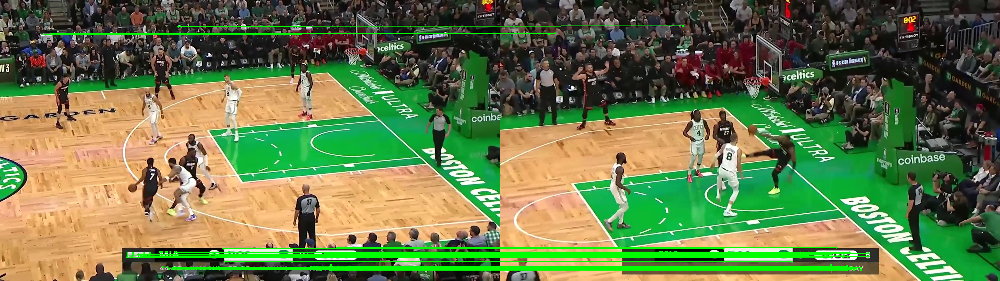

In [ ]:
import cv2
import numpy as np

def visualize_inlier_matches(prev_bgr, curr_bgr, pts_prev, pts_curr, radius=4, thickness=2):
    """
    Create a side-by-side image with inlier matches drawn between prev and curr frames.

    prev_bgr, curr_bgr: images (H,W,3), BGR
    pts_prev, pts_curr: Nx2 arrays of inlier points (float32)
    """
    # Make sure we have int coordinates
    pts_prev = np.round(pts_prev).astype(int)
    pts_curr = np.round(pts_curr).astype(int)

    # Put images side by side
    H1, W1 = prev_bgr.shape[:2]
    H2, W2 = curr_bgr.shape[:2]
    H = max(H1, H2)
    W = W1 + W2

    canvas = np.zeros((H, W, 3), dtype=np.uint8)
    canvas[0:H1, 0:W1] = prev_bgr
    canvas[0:H2, W1:W1+W2] = curr_bgr

    # Draw points and lines
    for (x1, y1), (x2, y2) in zip(pts_prev, pts_curr):
        # point in prev image
        cv2.circle(canvas, (x1, y1), radius, (0, 255, 0), -1)
        # point in curr image (shift x by W1 because it's on the right)
        cv2.circle(canvas, (x2 + W1, y2), radius, (0, 255, 0), -1)
        # line between them
        cv2.line(canvas, (x1, y1), (x2 + W1, y2), (0, 255, 0), thickness)

    return canvas
if H is not None:
    vis = visualize_inlier_matches(prev_bgr, curr_bgr, pts_prev_inliers, pts_curr_inliers)

    # In Colab:
    from google.colab.patches import cv2_imshow
    cv2_imshow(vis)

    # Or if you use your own imshow helper:
    # imshow([vis], ["Inlier matches"])


In [ ]:
import cv2
import numpy as np

def get_court_hull_band(court_mask, band_width=5):
    """
    court_mask: (H,W) uint8, 0/1 or 0/255, non-zero = court.
    Returns:
        hull_mask: (H,W) uint8, 0/255 filled convex hull region
        band_mask: (H,W) uint8, 0/255 thin band around the hull boundary
    """
    # normalize to 0/255
    cm = (court_mask > 0).astype(np.uint8) * 255

    # find contours
    contours, _ = cv2.findContours(cm, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return np.zeros_like(cm), np.zeros_like(cm)

    # take largest contour
    largest = max(contours, key=cv2.contourArea)

    # convex hull of that contour
    hull = cv2.convexHull(largest)

    H, W = cm.shape
    hull_mask = np.zeros((H, W), dtype=np.uint8)
    cv2.fillConvexPoly(hull_mask, hull, 255)

    # create a thin band along the hull boundary:
    # band = dilated(hull) - eroded(hull)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_width, band_width))
    dilated = cv2.dilate(hull_mask, kernel)
    eroded  = cv2.erode(hull_mask, kernel)
    band_mask = cv2.subtract(dilated, eroded)
    band_mask = (band_mask > 0).astype(np.uint8) * 255

    return hull_mask, band_mask


In [ ]:
import cv2
import numpy as np


def compute_frame_and_court_mask(img_path, player_class_ids=(3,)):
    """
    From an image path, compute:
      - frame (BGR)
      - court_mask  (0/255 uint8)
      - player_boxes (list of (x1,y1,x2,y2))
    using your existing Lab+scanline pipeline.
    """
    frame = cv2.imread(img_path)
    if frame is None:
        raise RuntimeError(f"Cannot read image: {img_path}")

    H, W = frame.shape[:2]

    # ---- players → ignore (your functions) ----
    label_path = img_path_to_label_path(img_path)

    player_boxes = load_yolo_txt_boxes_xyxy_mixed(
        label_path,
        frame.shape,
        player_class_ids=player_class_ids
    )
    M_players = build_player_mask(frame.shape, player_boxes, margin=15)
    M_ignore  = M_players

    # ---- Lab + blur ----
    L, a_blur, b_blur = compute_lab_chroma_smoothed_gaussian(frame, ksize=9, sigma=0)

    # ---- Scanline segmentation → court mask ----
    mask_smooth = segment_court_by_chroma_scanlines(
        a_blur,
        b_blur,
        M_ignore,
        T_cont=0.5,
        min_segment_len=100,
        max_avg_delta=3.0,
        y_min_frac=0.1,
        y_max_frac=0.98
    )
    court_mask = (mask_smooth > 0).astype(np.uint8) * 255  # ensure 0/255

    # (you also computed hist, a_bin_idx, b_bin_idx, etc. if needed)
    # hist, a_bin_idx, b_bin_idx, ys_dom, xs_dom = compute_dominant_court_bin_lab(
    #     a_blur, b_blur, court_mask, num_bins=16
    # )

    return frame, court_mask, player_boxes


In [ ]:
def get_court_hull_band(court_mask, band_width=7):
    """
    court_mask: (H,W) 0/255 uint8, non-zero = court.
    Returns:
        hull_mask: (H,W) 0/255 filled convex hull region
        band_mask: (H,W) 0/255 thin band along the hull boundary
    """
    cm = (court_mask > 0).astype(np.uint8) * 255

    contours, _ = cv2.findContours(cm, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        H, W = cm.shape
        return np.zeros((H, W), dtype=np.uint8), np.zeros((H, W), dtype=np.uint8)

    largest = max(contours, key=cv2.contourArea)
    hull = cv2.convexHull(largest)

    H, W = cm.shape
    hull_mask = np.zeros((H, W), dtype=np.uint8)
    cv2.fillConvexPoly(hull_mask, hull, 255)

    # thin band around hull boundary
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_width, band_width))
    dilated = cv2.dilate(hull_mask, kernel)
    eroded  = cv2.erode(hull_mask, kernel)
    band_mask = cv2.subtract(dilated, eroded)
    band_mask = (band_mask > 0).astype(np.uint8) * 255

    return hull_mask, band_mask


In [ ]:
def in_any_box(pt, boxes):
    if boxes is None:
        return False
    x, y = pt
    for (bx1, by1, bx2, by2) in boxes:
        if bx1 <= x <= bx2 and by1 <= y <= by2:
            return True
    return False


def compute_court_homography_on_hull_klt(
    prev_bgr,
    curr_bgr,
    court_mask_prev,
    court_mask_curr,
    player_boxes_prev=None,
    player_boxes_curr=None,
    max_corners=1000,
    quality_level=0.01,
    min_distance=5,
    block_size=7,
    band_width=7
):
    """
    Estimate homography using KLT features lying on the court hull band.
    Returns:
        H, pts_prev_inliers, pts_curr_inliers, hull_prev, hull_curr
    """

    prev_gray = cv2.cvtColor(prev_bgr, cv2.COLOR_BGR2GRAY)
    curr_gray = cv2.cvtColor(curr_bgr, cv2.COLOR_BGR2GRAY)

    H_img, W_img = prev_gray.shape

    # --- hull/band for both frames ---
    hull_prev, band_prev = get_court_hull_band(court_mask_prev, band_width=band_width)
    hull_curr, band_curr = get_court_hull_band(court_mask_curr, band_width=band_width)

    # feature detection mask = band of prev
    mask_prev = band_prev.copy()

    # remove players from that band
    if player_boxes_prev is not None:
        for (x1, y1, x2, y2) in player_boxes_prev:
            x1 = max(0, int(x1));  y1 = max(0, int(y1))
            x2 = min(W_img - 1, int(x2));  y2 = min(H_img - 1, int(y2))
            mask_prev[y1:y2+1, x1:x2+1] = 0

    # --- detect corners only on hull band ---
    pts_prev = cv2.goodFeaturesToTrack(
        prev_gray,
        maxCorners=max_corners,
        qualityLevel=quality_level,
        minDistance=min_distance,
        blockSize=block_size,
        mask=mask_prev
    )
    if pts_prev is None or len(pts_prev) < 4:
        return None, None, None, hull_prev, hull_curr

    # --- KLT tracking ---
    pts_curr, status, err = cv2.calcOpticalFlowPyrLK(
        prev_gray,
        curr_gray,
        pts_prev,
        None,
        winSize=(21, 21),
        maxLevel=3,
        criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01)
    )

    status = status.reshape(-1)
    pts_prev = pts_prev.reshape(-1, 2)[status == 1]
    pts_curr = pts_curr.reshape(-1, 2)[status == 1]

    if len(pts_prev) < 4:
        return None, None, None, hull_prev, hull_curr

    # --- filter: must be on hull band / hull + not on players ---
    pts_prev_f = []
    pts_curr_f = []

    Hc, Wc = prev_gray.shape
    for p_prev, p_curr in zip(pts_prev, pts_curr):
        x1, y1 = p_prev
        x2, y2 = p_curr
        xi1, yi1 = int(round(x1)), int(round(y1))
        xi2, yi2 = int(round(x2)), int(round(y2))

        if not (0 <= xi1 < Wc and 0 <= yi1 < Hc):
            continue
        if not (0 <= xi2 < Wc and 0 <= yi2 < Hc):
            continue

        # prev point must be on hull band
        if band_prev[yi1, xi1] == 0:
            continue

        # curr should at least be inside hull (or band)
        if hull_curr[yi2, xi2] == 0 and band_curr[yi2, xi2] == 0:
            continue

        if in_any_box((x1, y1), player_boxes_prev):
            continue
        if in_any_box((x2, y2), player_boxes_curr):
            continue

        pts_prev_f.append(p_prev)
        pts_curr_f.append(p_curr)

    pts_prev_f = np.array(pts_prev_f, dtype=np.float32)
    pts_curr_f = np.array(pts_curr_f, dtype=np.float32)

    if len(pts_prev_f) < 4:
        return None, None, None, hull_prev, hull_curr

    # --- homography with RANSAC ---
    H, inliers = cv2.findHomography(
        pts_curr_f,
        pts_prev_f,
        method=cv2.RANSAC,
        ransacReprojThreshold=3.0,
        maxIters=2000,
        confidence=0.995
    )
    if H is None:
        return None, None, None, hull_prev, hull_curr

    inliers = inliers.ravel().astype(bool)
    pts_prev_inliers = pts_prev_f[inliers]
    pts_curr_inliers = pts_curr_f[inliers]

    if len(pts_prev_inliers) < 4:
        return None, None, None, hull_prev, hull_curr

    return H, pts_prev_inliers, pts_curr_inliers, hull_prev, hull_curr


In [ ]:
def visualize_inlier_matches(prev_bgr, curr_bgr, pts_prev, pts_curr, radius=4, thickness=2):
    pts_prev = np.round(pts_prev).astype(int)
    pts_curr = np.round(pts_curr).astype(int)

    H1, W1 = prev_bgr.shape[:2]
    H2, W2 = curr_bgr.shape[:2]
    H = max(H1, H2)
    W = W1 + W2

    canvas = np.zeros((H, W, 3), dtype=np.uint8)
    canvas[0:H1, 0:W1] = prev_bgr
    canvas[0:H2, W1:W1+W2] = curr_bgr

    for (x1, y1), (x2, y2) in zip(pts_prev, pts_curr):
        cv2.circle(canvas, (x1, y1), radius, (0, 255, 0), -1)
        cv2.circle(canvas, (x2 + W1, y2), radius, (0, 255, 0), -1)
        cv2.line(canvas, (x1, y1), (x2 + W1, y2), (0, 255, 0), thickness)

    return canvas


In [ ]:
img_prev_path = "Image/frame_128_jpg.rf.bc29dc6ee2d722a5253e3297c53b95ac.jpg"
img_curr_path = "Image/frame_129_jpg.rf.e1ca73139aed49cebbd887240b464a2c.jpg"

# 1) compute frame + court_mask + player boxes for both
prev_bgr, court_mask_prev, boxes_prev = compute_frame_and_court_mask(img_prev_path, player_class_ids=(3,))
curr_bgr, court_mask_curr, boxes_curr = compute_frame_and_court_mask(img_curr_path, player_class_ids=(3,))

# 2) compute homography using only hull-band features
H, pts_prev_inliers, pts_curr_inliers, hull_prev, hull_curr = compute_court_homography_on_hull_klt(
    prev_bgr,
    curr_bgr,
    court_mask_prev,
    court_mask_curr,
    player_boxes_prev=boxes_prev,
    player_boxes_curr=boxes_curr,
    band_width=7
)

print("H:\n", H)
print("num inliers on hull:", 0 if H is None else len(pts_prev_inliers))

# 3) visualize matches
if H is not None:
    vis = visualize_inlier_matches(prev_bgr, curr_bgr, pts_prev_inliers, pts_curr_inliers)

    from google.colab.patches import cv2_imshow
    cv2_imshow(vis)


H:
 None
num inliers on hull: 0


In [ ]:
import cv2
import numpy as np

def in_any_box(pt, boxes):
    if boxes is None:
        return False
    x, y = pt
    for (bx1, by1, bx2, by2) in boxes:
        if bx1 <= x <= bx2 and by1 <= y <= by2:
            return True
    return False

def compute_court_homography_on_hull_orb(
    prev_bgr,
    curr_bgr,
    court_mask_prev,
    court_mask_curr,
    player_boxes_prev=None,
    player_boxes_curr=None,
    n_features=2000,
    band_width=7
):
    """
    Stronger version using ORB keypoints+descriptors restricted to court hull band.
    Returns:
        H, pts_prev_inliers, pts_curr_inliers, hull_prev, hull_curr
    """

    prev_gray = cv2.cvtColor(prev_bgr, cv2.COLOR_BGR2GRAY)
    curr_gray = cv2.cvtColor(curr_bgr, cv2.COLOR_BGR2GRAY)

    H_img, W_img = prev_gray.shape

    # --- hull + band for both ---
    hull_prev, band_prev = get_court_hull_band(court_mask_prev, band_width=band_width)
    hull_curr, band_curr = get_court_hull_band(court_mask_curr, band_width=band_width)

    # Detection mask on prev: hull band minus players
    mask_prev = band_prev.copy()
    if player_boxes_prev is not None:
        for (x1, y1, x2, y2) in player_boxes_prev:
            x1 = max(0, int(x1));  y1 = max(0, int(y1))
            x2 = min(W_img - 1, int(x2));  y2 = min(H_img - 1, int(y2))
            mask_prev[y1:y2+1, x1:x2+1] = 0

    # Detection mask on curr: hull band minus players
    mask_curr = band_curr.copy()
    if player_boxes_curr is not None:
        for (x1, y1, x2, y2) in player_boxes_curr:
            x1 = max(0, int(x1));  y1 = max(0, int(y1))
            x2 = min(W_img - 1, int(x2));  y2 = min(H_img - 1, int(y2))
            mask_curr[y1:y2+1, x1:x2+1] = 0

    # --- ORB detector ---
    orb = cv2.ORB_create(nfeatures=n_features)

    kps_prev, des_prev = orb.detectAndCompute(prev_gray, mask_prev)
    kps_curr, des_curr = orb.detectAndCompute(curr_gray, mask_curr)

    if des_prev is None or des_curr is None:
        return None, None, None, hull_prev, hull_curr
    if len(kps_prev) < 4 or len(kps_curr) < 4:
        return None, None, None, hull_prev, hull_curr

    # --- match descriptors (Hamming for ORB) ---
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des_prev, des_curr)
    if len(matches) < 4:
        return None, None, None, hull_prev, hull_curr

    # sort by distance, keep best subset if you want
    matches = sorted(matches, key=lambda m: m.distance)
    # e.g., keep best 500
    matches = matches[:500]

    pts_prev = []
    pts_curr = []

    for m in matches:
        p_prev = kps_prev[m.queryIdx].pt  # (x, y)
        p_curr = kps_curr[m.trainIdx].pt

        x1, y1 = p_prev
        x2, y2 = p_curr
        xi1, yi1 = int(round(x1)), int(round(y1))
        xi2, yi2 = int(round(x2)), int(round(y2))

        if not (0 <= xi1 < W_img and 0 <= yi1 < H_img):
            continue
        if not (0 <= xi2 < W_img and 0 <= yi2 < H_img):
            continue

        # enforce court/hull constraints
        if hull_prev[yi1, xi1] == 0 and band_prev[yi1, xi1] == 0:
            continue
        if hull_curr[yi2, xi2] == 0 and band_curr[yi2, xi2] == 0:
            continue

        # exclude players
        if in_any_box((x1, y1), player_boxes_prev):
            continue
        if in_any_box((x2, y2), player_boxes_curr):
            continue

        pts_prev.append(p_prev)
        pts_curr.append(p_curr)

    pts_prev = np.array(pts_prev, dtype=np.float32)
    pts_curr = np.array(pts_curr, dtype=np.float32)

    if len(pts_prev) < 4:
        return None, None, None, hull_prev, hull_curr

    # --- Homography with RANSAC ---
    H, inliers = cv2.findHomography(
        pts_curr,
        pts_prev,
        method=cv2.RANSAC,
        ransacReprojThreshold=3.0,
        maxIters=2000,
        confidence=0.995
    )
    if H is None:
        return None, None, None, hull_prev, hull_curr

    inliers = inliers.ravel().astype(bool)
    pts_prev_inliers = pts_prev[inliers]
    pts_curr_inliers = pts_curr[inliers]

    if len(pts_prev_inliers) < 4:
        return None, None, None, hull_prev, hull_curr

    return H, pts_prev_inliers, pts_curr_inliers, hull_prev, hull_curr


In [ ]:
prev_bgr, court_mask_prev, boxes_prev = compute_frame_and_court_mask(img_prev_path, player_class_ids=(3,))
curr_bgr, court_mask_curr, boxes_curr = compute_frame_and_court_mask(img_curr_path, player_class_ids=(3,))

H, pts_prev_inliers, pts_curr_inliers, hull_prev, hull_curr = compute_court_homography_on_hull_orb(
    prev_bgr,
    curr_bgr,
    court_mask_prev,
    court_mask_curr,
    player_boxes_prev=boxes_prev,
    player_boxes_curr=boxes_curr,
    n_features=2000,
    band_width=7
)

print("H:\n", H)
print("num inliers:", 0 if H is None else len(pts_prev_inliers))

if H is not None:
    vis = visualize_inlier_matches(prev_bgr, curr_bgr, pts_prev_inliers, pts_curr_inliers)
    cv2_imshow(vis)


H:
 None
num inliers: 0
